# The Path Problem

The path problem is the determine whether there is a path between each pair of vertices of a graph

## Random Graphs

In order to test algorithms for the path problem, we first write code to generate random graphs.

The function below generates a random graph
A new function is defined in julia with the following elements:

1.  The ```function``` keyword
2.  The name of the function
3.  The names of the arguments to the function in parentheses and separated by commas
4.  The body or code of the function
5.  The ```end``` keyword

The function below generates the incidence matrix of a graph with ```n``` vertices and probability ```p``` that each edge exists

In [5]:
function randomgraph( n, p )
    return rand(n,n) .< p
end

randomgraph (generic function with 1 method)

The following code show how to call this function to generate a random graph

In [9]:
using Random
Random.seed!(1)
graph = randomgraph(5, 0.25)

5×5 BitArray{2}:
  true   true  false   true   true
 false  false  false  false  false
 false  false  false   true  false
  true  false  false  false  false
 false  false  false  false  false

## The Brute Force Approach

The following code implements the brute force approach to the path problem Some of the features of this code include:

1.  The default arguments for the function
1.  The ```if``` statement
2.  The ```isempty``` function
3.  The ```push!``` and ```pop!``` functions
4.  The function is called recursively (calls itself)

In [10]:
function findpaths!( edge, path = falses(size(edge,1),size(edge,1)), currpath = Int[] )
    for v in 1:size(edge,1)
        if !( v in currpath )
            if isempty(currpath) || edge[currpath[end], v]
                push!( currpath, v )
                path[currpath[1], v] = true
                findpaths!( edge, path, currpath )
                pop!( currpath )
            end
        end
    end
    return path
end

findpaths! (generic function with 3 methods)

findpaths! can be called as follows:

In [11]:
findpaths!( graph )

5×5 BitArray{2}:
  true   true  false   true   true
 false   true  false  false  false
  true   true   true   true   true
  true   true  false   true   true
 false  false  false  false   true

## The dynamic programming approach

In [14]:
function findpaths2!( edge )
    path = copy(edge)
    n = size(edge,1)
    for m = 1:n
        path[m,m] = true
        for v1 = 1:n
            for vk = 1:n
                if path[v1,m] && path[m,vk]
                    path[v1,vk] = true
                end
            end
        end
    end
    return path
end

findpaths2! (generic function with 1 method)

Generate a bunch of random graphs to see if the two functions generate the same results

In [17]:
using Random
Random.seed!(1)
n = 10
for i = 1:10
    edge = randomgraph(n, 0.3)
    path = findpaths!( edge )
    
    path2 = findpaths2!( edge )
    @assert( path == path2 )
end

Let's time the code for the fully connected graph with 1 through 10 vertices
Note that the ```time_ns``` function gives a measure of the current time in nanoseconds

In [21]:
times = Float64[]
for n = 1:10
    edge = trues(n,n)

    start = time_ns()
    findpaths!( edge )
    push!( times, (time_ns() - start)/10^9 )
end

Notice how rapidly the time increases

In [19]:
times

10-element Array{Float64,1}:
 1.5e-6     
 1.3e-6     
 1.2e-6     
 4.7e-6     
 2.59e-5    
 0.000216201
 0.001300203
 0.01083183 
 0.100727472
 1.089652844

Let's plot the times

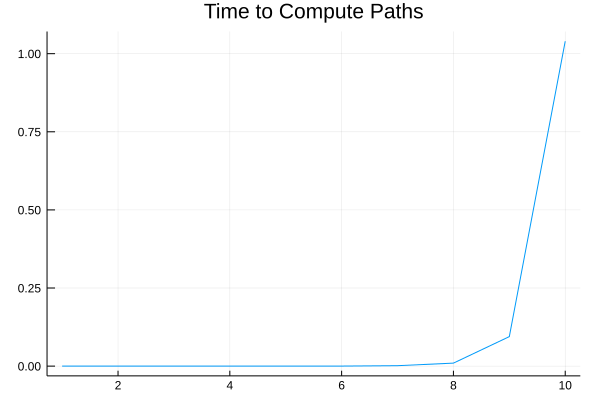

In [24]:
using Plots
plot(times, legend=:none, title="Time to Compute Paths")

Save the last plot

In [25]:
savefig("time.png")

To calculate the time per iteration, we take a look at the time divided by the factorial

In [122]:
times ./ factorial.(1:10)

10-element Array{Float64,1}:
 2.1e-6               
 2.5e-7               
 1.5e-7               
 1.75e-7              
 6.450083333333333e-7 
 2.522222222222222e-7 
 2.485123015873016e-7 
 3.145665922619048e-7 
 2.8351244488536156e-7
 2.950398613866843e-7 

In [22]:
timeperiteration = times[end]/factorial(10)

2.8654192598104057e-7

This is how long we think it would take (in years) to perform this calculate for 25 vertices

Note that the age of the universe is believed to be about 1.4e10 years

In [23]:
time25 = timeperiteration * factorial(BigFloat(25))/(365 * 24 * 60 * 60)

1.409377219721118852608488489931485390318256303207942424979928421647581335616444e+11

How many years would an exponential time algorithm take for 100 vertices

In [47]:
timeperiteration*BigFloat(2)^100/(365*24*60*60)

1.270879523748760248797970573313039066463723997970573313039066463723997970573316e+16

Let's calculate the times for the dynamic programming version

For this one, we can go to 100

In [26]:
times2 = Float64[]
for n = 1:100
    edge = trues(n,n)
    start = time_ns()
    findpaths2!( edge )
    push!( times2, (time_ns() - start)/10^9 )
end

The dynamic programming algorithm takes more than a factor of about 300 times less time to calculate for 100 vertices than the brute force algorithm took for 10 vertices

In [27]:
times2

100-element Array{Float64,1}:
 7.0e-7     
 2.0e-7     
 4.0e-7     
 5.0e-7     
 8.0e-7     
 9.0e-7     
 1.3e-6     
 1.88e-5    
 2.5e-6     
 3.1e-6     
 4.2e-6     
 5.4e-6     
 6.8e-6     
 ⋮          
 0.002410006
 0.002568606
 0.002720907
 0.002530506
 0.003151208
 0.002778707
 0.003128807
 0.003100808
 0.003454409
 0.003198008
 0.003251208
 0.003584008

Here is the speedup factor

The dynamic programming algorithm is a million times faster for 10 vertices

In [11]:
times./times2[1:10]

10-element Array{Float64,1}:
      2.0              
      9.0              
      6.0              
     26.000000000000004
    134.5              
    971.5000000000001  
   3446.5075           
  26935.06             
 147398.46285714288    
      1.43411662e6     

Let's work out how big we can run with the dynamic programming algorithm

First, we look at the amount of time per iteration

In [134]:
times2 ./ (1:100).^3

100-element Array{Float64,1}:
 2.0e-6               
 5.0e-8               
 1.8518518518518518e-8
 7.8125e-9            
 8.800000000000001e-9 
 6.018518518518519e-9 
 5.5393586005830905e-9
 5.078125e-9          
 4.938271604938271e-9 
 4.9e-9               
 4.8835462058602555e-9
 4.687500000000001e-9 
 4.642694583522986e-9 
 ⋮                    
 3.871808547609895e-9 
 3.6703772290809326e-9
 3.451174474601597e-9 
 3.802429214268102e-9 
 3.6747426826645386e-9
 4.120121504868863e-9 
 3.497543082081936e-9 
 3.704727737991898e-9 
 3.6308798441500953e-9
 3.606922923271766e-9 
 3.531804113989605e-9 
 3.386507e-9          

The time per iteration is about 4e-9

In [137]:
timeperiteration2 = 4e-9

4.0e-9

How long do we think it would take to calculate for 10,000 vertices

In [141]:
timeperiteration2*(10000^3)/60

66.66666666666667

How long would it take the brute force approach for 14 vertices

In [146]:
timeperiteration*factorial(14)/60

428.68451585959997